# Titulo Proyecto: Generador de Canciones Monofónicas

Autor: David Nogales Pérez

## 1.- Planteamiento del proyecto

### 1.1.- Explicación del proyecto a resolver

- El proyecto se basa en continuar una melodia dada siguiendo el estilo aprendido de los datos de entrenamiento. En este caso el estilo será Barroco ya que el [dataset](https://archive.ics.uci.edu/ml/datasets/Bach+Chorales) es una linea vocal de 100 corales de Bach. 

### 1.2.- Como se pretende resolver el problema en un principio.

- Utilizando Deep Learning para que el modelo luego de ser entrenado pueda intuir las reglas de composición que utilizó Bach en su tiempo, y aprovechar estas para generar melodias con su estilo.

### 1.3.- Qué datos y cómo deberían ser los datos que harían falta para resolver este problema.

- Como se trata de generar una melodia, como minimo se necesitaria la información de las notas con sus respectivas duraciones. Pero tambien se podria utilizar informacion extra como la tonalidad de la melodia (su armadura) o el compas en el que se trabaja. 

### 1.4.- Cómo debería ser el modelo que permita resolver esto y qué adaptación tendría que hacer a los datos.

- Ya que el problema es de tipo "Time Series" habria que utilizar alguna red recurrente ya que nos permitirá recordar información a traves del tiempo. Para ello se deberia hallar una representación de los datos que permita codificar la relación de tiempo de los mismos.

## 2.- Implementación del proyecto

### 2.1.- Sección para hacer todos los imports del proyecto (no poner imports que no utilicéis)

In [1]:
# CODE
!pip install -q git+https://github.com/tensorflow/docs 

!apt-get update
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2


Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:2 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [696 B]
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:11 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:12 http://security.ubuntu.com/ubuntu bionic-security/restric

In [2]:
from pyparsing import OneOrMore, nestedExpr  # for parsing lisp file
from pathlib import Path
import gdown

from music21 import *
from IPython.display import Image, Audio

from google.colab import files

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, TensorBoard, ModelCheckpoint
from tensorflow.python.data.ops.dataset_ops import AUTOTUNE
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

### 2.2.- Sección para todo lo relacionado con la adaptación, creación, preparación y carga del/los dataset.

In [3]:
# CODE

#Parses a data row in lisp to DataFrame format
def parse_line(inputdata,chorales_df):
  data = OneOrMore(nestedExpr()).parseString(inputdata)
  data_list = data.asList()
  id = data_list[0][0]
  for event in data_list[0][1:]:
      event = dict(event)
      event['id'] = id
      chorales_df = chorales_df.append(event,ignore_index=True)
  return chorales_df

#Reads the .lisp file and returns a DataFrame with the data
def parse_chorales(filename):
  text = ""
  print(f"Reading {filename} file...")
  with open(filename) as file:
    #filter blank lines
    text = list(filter(None, (line.rstrip() for line in file)))
  print(f"Data from {len(text)} Chorales:")
  print(f"Parsing data...")
  chorales_df = pd.DataFrame(columns=['id','st', 'pitch', 'dur', 'keysig', 'timesig', 'fermata'])
  for inputdata in text:
    chorales_df = parse_line(inputdata,chorales_df)
  print(f"Parsing data finished")
  return chorales_df

#Downloads the original data, the parsed data or the best model from google drive public links to the current directory
def download_data(output_name):
  if(output_name=='chorales.csv'):
    id = '1SBhZ_PBeEaakP7HtF6gncFJFB1By7kmT'
  elif(output_name=='chorales.lisp'):
    id = '1hQrpR3syh2h2sPjv2ngbh_EwWbAMVVBk'
  else:
    id = '1Fx-2F-fUcoPynAow6LR1XmIeLNmuX6o8'
  url=f'https://drive.google.com/uc?id={id}'
  output=output_name
  gdown.download(url, output, quiet=False)
  print("Data Downloaded!")

#Reads the original data or the parsed data and returns a DataFrame with the data
def read_chorales(download_treated=False):
    original_data_name = 'chorales.lisp'
    parsed_data_name = 'chorales.csv' 
    file_name = parsed_data_name if download_treated else original_data_name
    download_data(file_name)
    my_file = Path(parsed_data_name)
    if not my_file.is_file():
      chorales_df = parse_chorales(original_data_name)
      chorales_df.to_csv(parsed_data_name, index=False)
    else:
      chorales_df = pd.read_csv(parsed_data_name)
      print(f"File {parsed_data_name} already in workspace!")
    return chorales_df


In [4]:
#Uncomment to download original dataset and parse it.
#chorales_df  = read_chorales(download_treated=False)

#Download parsed dataset.
chorales_df  = read_chorales(download_treated=True)
chorales_df

Downloading...
From: https://drive.google.com/uc?id=1SBhZ_PBeEaakP7HtF6gncFJFB1By7kmT
To: /content/chorales.csv
100%|██████████| 89.9k/89.9k [00:00<00:00, 11.2MB/s]

Data Downloaded!
File chorales.csv already in workspace!


,id,st,pitch,dur,keysig,timesig,fermata
0,1,8,67,4,1,12,0
1,1,12,67,8,1,12,0
2,1,20,74,4,1,12,0
3,1,24,71,6,1,12,0
4,1,30,69,2,1,12,0
...,...,...,...,...,...,...,...
4688,285,140,72,4,0,16,0
4689,285,144,74,2,0,16,0
4690,285,146,72,2,0,16,0
4691,285,148,71,8,0,16,0


En la tabla se pueden observar las sig. carateristicas:
  - **id:** identificador de la coral correspondiente 
  - **st:** offset de comienzo de la nota
  - **pitch:** identificador de la nota codificada en MIDI 
  - **dur:** duracion de la nota 
  - **keysig:** La armadura de la pieza(numeros negativos=bemoles,numeros positivos=sostenidos) 
  - **timesig:** el compas de la pieza (12=3/4,16=4/4) 
  - **fermata:** Si la nota presenta una prolongacion de sonido o no. 

In [5]:
treated_df = chorales_df.copy(deep=True)
treated_df = treated_df.drop(["id","st"],axis=1)
treated_df[0:21]

,pitch,dur,keysig,timesig,fermata
0,67,4,1,12,0
1,67,8,1,12,0
2,74,4,1,12,0
3,71,6,1,12,0
4,69,2,1,12,0
5,67,4,1,12,0
6,67,6,1,12,0
7,69,2,1,12,0
8,71,4,1,12,0
9,69,8,1,12,1


In [6]:
for feature in treated_df.columns:
  print(feature) 
  print(treated_df[feature].value_counts())
  print('-'*100)

#Used to encode the duration of a pitch
def encode_duration_in_pitch(data_df):
  treated_df = data_df.copy(deep=True)
  duration_col = treated_df["dur"]
  #The cumulative sum at each row will be the start of the new event, we insert the first event 0 as well
  events_index =pd.concat([pd.DataFrame(np.zeros(1)),duration_col.cumsum()],ignore_index=True)
  #Rename the column for clarity and cast to int instead of using floats given that they are indexes
  events_index = events_index.rename({0:"event_index"},axis=1).astype(int)
  #Drop the last event because it doesn't exist
  events_index = events_index.head(-1)
  #Copy the relevant data of the events
  events_index = pd.concat([events_index,treated_df[['pitch', 'dur']].copy(deep=True)],axis=1)
  #Duplicate rows consecutively according to the values in column 'dur'
  treated_df = treated_df.loc[treated_df.index.repeat(treated_df['dur'])].reset_index(drop=True)

  #Mask for indexes that aren't initial events
  select_not_initial_events = ~treated_df.index.isin(events_index["event_index"])

  #Selecting a value which is not in range of the soprano voice
  VALUE_NOT_IN_DOMAIN = 59
  #Encoding  duration in pitch and dropping duration column
  treated_df["pitch"][select_not_initial_events] = VALUE_NOT_IN_DOMAIN
  treated_df = treated_df.drop('dur',axis=1)

  return treated_df

def one_hot_pitch_data(new_df):
  pitch_dummies = pd.get_dummies(new_df.pitch, prefix='pitch').rename({'pitch_59':"repeat"},axis=1).astype(int)
  new_df = new_df.drop('pitch',axis = 1)
  new_df = new_df.join(pitch_dummies)
  return new_df

def one_hot_encode_data(old_df):
  new_df = old_df.copy(deep=True)
  encode_key_signature = lambda x: f"{f'{x}_sharp' if x>0 else f'{abs(x)}_flat' if x<0 else 'common'}"
  new_df.keysig = old_df.keysig.map(encode_key_signature)
  encode_time_signature = lambda x: 1 if x==12 else 0
  new_df.timesig = old_df.keysig.map(encode_time_signature)
  
  # One hot encode key signature
  #keysig_dummies = pd.get_dummies(new_df.keysig, prefix='keysig')
  #new_df = new_df.drop('keysig',axis = 1)
  #new_df = new_df.join(keysig_dummies)
  
  #Encodes duration column in pitch column
  new_df = encode_duration_in_pitch(new_df)

  # One hot encode pitch
  new_df = one_hot_pitch_data(new_df)
  # One hot encode duration
  #duration_dummies = pd.get_dummies(new_df.dur, prefix='dur')
  #new_df = new_df.drop('dur',axis = 1)
  #new_df = new_df.join(duration_dummies)

  new_df = new_df.drop(["fermata","timesig","keysig"],axis=1)
  vocab = dict(zip(new_df.columns,np.arange(59,80)))
  return new_df,vocab
new_df,vocabulary = one_hot_encode_data(treated_df)
new_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


pitch
69    785
71    647
74    599
72    514
67    501
73    281
70    264
76    204
65    160
64    148
66    146
68     99
75     97
77     72
62     67
78     42
79     19
61     17
60     16
63     15
Name: pitch, dtype: int64
----------------------------------------------------------------------------------------------------
dur
4     3295
2      805
8      432
6       60
12      55
1       32
16      10
3        4
Name: dur, dtype: int64
----------------------------------------------------------------------------------------------------
keysig
 0    919
 1    836
-2    749
 2    674
 3    637
-1    486
-3    234
 4     82
-4     76
Name: keysig, dtype: int64
----------------------------------------------------------------------------------------------------
timesig
16    4317
12     376
Name: timesig, dtype: int64
----------------------------------------------------------------------------------------------------
fermata
0    4108
1     585
Name: fermata, dtype: int64
----------

,repeat,pitch_60,pitch_61,pitch_62,pitch_63,pitch_64,pitch_65,pitch_66,pitch_67,pitch_68,pitch_69,pitch_70,pitch_71,pitch_72,pitch_73,pitch_74,pitch_75,pitch_76,pitch_77,pitch_78,pitch_79
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19465,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
19466,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
19467,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
19468,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Arriba se pueden observar la cantidad de valores diferentes para cada columna. Ademas de la tabla con los datos codificados con one-hot encoding.

Se utilizó esa representación ya que la cantidad de notas distintas es relativamente pequeña lo cual permitiría clasificar las notas por categorias y el modelo se limitaria a predecir la probabilidad de cada una de ellas.

In [7]:
def create_train_window(new_df, group_size=30):
    x_train = []
    y_train = []
    x_test = []
    y_test = []
    for i in range(0, len(new_df)-group_size-1):
        if(i < (len(new_df)-group_size-1)*0.8):
            x_train.append(new_df.iloc[i:group_size+i].to_numpy())
            y_train.append(new_df.iloc[i+group_size].to_numpy())
        else:
            x_test.append(new_df.iloc[i:group_size+i].to_numpy())
            y_test.append(new_df.iloc[i+group_size].to_numpy())
            
    return np.array(x_train), np.array(y_train), np.array(x_test), np.array(y_test)

In [8]:
len(new_df)
WINDOW = 150
x_train, y_train, x_test, y_test = create_train_window(new_df, WINDOW)
train_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(x_train), tf.constant(y_train)))
test_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(x_test), tf.constant(y_test)))

seq = 20
train_dataset = train_dataset.batch(seq,drop_remainder=True).prefetch(AUTOTUNE).cache()
test_dataset = test_dataset.batch(seq,drop_remainder=True).prefetch(AUTOTUNE).cache()
print('x_train shape:',np.shape(x_train))
print('y_train shape:',np.shape(y_train))

x_train shape: (15456, 150, 21)
y_train shape: (15456, 21)


### 2.3.- Sección para construir el modelo/s y presentar su estructura.

In [25]:
# CODE
def get_model(input_shape,output_shape,loss):
  model = Sequential()

  model.add(LSTM(128, input_shape=input_shape, return_sequences=True))
  model.add(LSTM(128, return_sequences=False, dropout=0, recurrent_dropout=0))
  model.add(Dense(64, activation='relu'))
  model.add(Dropout(0.2))
  model.add(Dense(32, activation='relu'))
  model.add(Dropout(0.2))
  model.add(Dense(output_shape, activation='sigmoid'))
  model.compile(optimizer='adam', loss=loss, metrics=['accuracy'])
  model.summary()
  return model

input_shape=np.shape(x_train[0])
output_shape = np.shape(y_train)[1]
loss = 'categorical_crossentropy'
#loss = 'sparse_categorical_crossentropy'
BATCH_SIZE=20
model = get_model(input_shape,output_shape,loss)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 150, 128)          76800     
                                                                 
 lstm_9 (LSTM)               (None, 128)               131584    
                                                                 
 dense_12 (Dense)            (None, 64)                8256      
                                                                 
 dropout_8 (Dropout)         (None, 64)                0         
                                                                 
 dense_13 (Dense)            (None, 32)                2080      
                                                                 
 dropout_9 (Dropout)         (None, 32)                0         
                                                                 
 dense_14 (Dense)            (None, 21)               

### 2.4.- Sección para la parte del entrenamiento del/los modelo/s y la utilización de los diferentes mecanismos de callbacks.

In [10]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_accuracy', 
    factor=0.1, 
    patience=4, 
    verbose=0,
    mode='auto',
    min_delta=0.0001, 
    cooldown=0, 
    min_lr=0
)
early_stop = EarlyStopping(
    monitor='val_accuracy', 
    min_delta=0.001,
    patience=8,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
)
checkpoint_filepath = './checkpoint'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='auto',
    save_best_only=True
)

In [26]:
EPOCHS = 100
loss = 'categorical_crossentropy'
#loss = 'sparse_categorical_crossentropy'
model = get_model(input_shape,output_shape,loss)
history = model.fit(train_dataset, 
                    shuffle=False, 
                    epochs=EPOCHS,
                    validation_data=test_dataset,
                    callbacks=[reduce_lr,early_stop,model_checkpoint]
                    )

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 150, 128)          76800     
                                                                 
 lstm_11 (LSTM)              (None, 128)               131584    
                                                                 
 dense_15 (Dense)            (None, 64)                8256      
                                                                 
 dropout_10 (Dropout)        (None, 64)                0         
                                                                 
 dense_16 (Dense)            (None, 32)                2080      
                                                                 
 dropout_11 (Dropout)        (None, 32)                0         
                                                                 
 dense_17 (Dense)            (None, 21)               

In [27]:
score = model.evaluate(test_dataset, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.740721583366394
Test accuracy: 0.7658030986785889


### 2.5.- Sección para probar el funcionamiento del/los modelo/s entrenado/s empleando ejemplo/s de test.

In [28]:
#--------------Music sheet and player-------------------------------------------

# Shows graphically the stream of notes by generating a music sheet image or a piano roll or both
def show(music,show_piano_roll=False):
  display(Image(str(music.write('lily.png'))))
  if(show_piano_roll):
    music.plot()
#Maybe for changing the sound 
#https://www.reddit.com/r/learnpython/comments/76wdao/playing_music_with_pyfluidsynth/
#https://ksvi.mff.cuni.cz/~dingle/2019/prog_1/python_music.html

#Generates the MIDI file corresponding to the stream of notes and shows a player
def play(music): #
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(filename + '.wav'))

# --------------Encoding/Decoding Functions-------------------------------------

def decode_fragment(encoded_fragment,translate_name_to_pitch,encoded_column_names):
  decoded_melody = []
  for event in encoded_fragment:
    index = event.argmax()
    pitch_col_name = encoded_column_names[index]
    pitch_number = translate_name_to_pitch[pitch_col_name]
    if(pitch_number==59):
      #print("repeat")
      decoded_melody.append(0)
    else:
      #print(pitch_number)
      decoded_melody.append(pitch_number)
  print('decoded melody:',decoded_melody)
  return decoded_melody

def decoded_fragment_to_notes(decoded_fragment):
  notes = []
  event_index= 0
  fragment_length = len(decoded_fragment)
  last_note = 0
  note_duration = 0
  while(event_index<fragment_length):
    current_note = decoded_fragment[event_index]
    if(current_note==0):
      note_duration+=1
    else:
      if(last_note!=0):
        notes.append((last_note,note_duration))
      last_note = decoded_fragment[event_index]
      note_duration=1
    event_index+=1
  if(last_note!=0):
    notes.append((last_note,note_duration))

  print('notes and durations',notes)
  return notes

def notes_to_stream(notes_and_durations):
  notes_stream =  stream.Stream()
  for note_pitch,note_duration in notes_and_durations:
    #print(note_pitch,note_duration)
    current_note = note.Note(note_pitch) 
    current_note.duration = duration.Duration(note_duration/4)
    notes_stream.append(current_note) 
  return notes_stream

def encoded_frag_to_stream(sample,vocabulary,encoded_column_names):
  decoded_fragment = decode_fragment(sample,vocabulary,encoded_column_names)
  notes_and_durations = decoded_fragment_to_notes(decoded_fragment)
  stream_of_notes = notes_to_stream(notes_and_durations)
  return stream_of_notes

In [29]:
# Given a model, a sample and the relevant data to decode the sample returns a single prediction based on the input sample
def get_prediction(model,sample,vocabulary,encoded_column_names,sample_validation=None,print_info=True):
  sample_size,input_size = np.shape(sample)
  sample = np.reshape(sample, (1,sample_size,input_size))
  batch_size,sample_size,input_size=np.shape(sample)
  y_prediction = model.predict(sample)
  max = y_prediction[0].max()
  index = y_prediction[0].argmax()
  pred_sample =  np.vstack((sample[0],y_prediction))
  
  if(print_info):
    n_dashes = 45
    print("input shape:",np.shape(sample))
    print("output shape:",np.shape(y_prediction))
    print(f'{"-"*n_dashes}PREDICTION{"-"*n_dashes}\n-> max: {max:.2f} at index {index}')
    print("-"*100)
    strm_notes_pred = encoded_frag_to_stream(pred_sample,vocabulary,encoded_column_names)
    show(strm_notes_pred)
    print("-"*100)

  if (not sample_validation is None):
    max = sample_validation.max()
    index = sample_validation.argmax()
    pred_sample =  np.vstack((sample[0],sample_validation))

    if(print_info):
      print(f'{"-"*n_dashes}REAL{"-"*n_dashes}------\n------> max: {max} at index {index}')
      print("-"*100)
      strm_notes_val = encoded_frag_to_stream(pred_sample,vocabulary,encoded_column_names)
      show(strm_notes_val)
      print("-"*100)
  
  return y_prediction

input shape: (1, 150, 21)
output shape: (1, 21)
---------------------------------------------PREDICTION---------------------------------------------
-> max: 0.66 at index 10
----------------------------------------------------------------------------------------------------
decoded melody: [0, 0, 72, 0, 0, 0, 69, 0, 0, 0, 70, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 66, 0, 0, 0, 67, 0, 0, 0, 73, 0, 0, 0, 69, 0, 0, 0, 71, 0, 0, 0, 71, 0, 0, 0, 73, 0, 0, 0, 75, 0, 0, 0, 76, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 73, 0, 0, 0, 74, 0, 0, 0, 73, 0, 0, 0, 71, 0, 0, 0, 0, 0, 0, 0, 69, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 71, 0, 0, 0, 76, 0, 0, 0, 76, 0, 0, 0, 74, 0, 0, 0, 74, 0, 0, 0, 73, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 71, 0, 0, 0, 69, 0, 0, 0, 68, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0, 0, 69]
notes and durations [(72, 4), (69, 4), (70, 4), (69, 4), (67, 4), (66, 4), (67, 4), (73, 4), (69, 4), (71, 4), (71, 4), (73, 4), (75, 4), (76, 8), (71, 4), (73, 4), (74, 4), (73, 4), (71, 8), (69, 8), (71, 4), (71, 4), (76

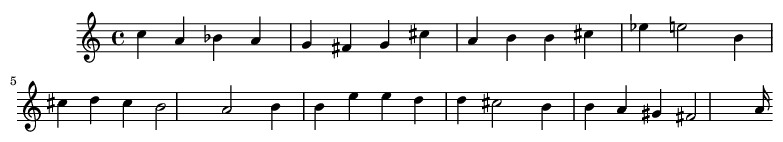

----------------------------------------------------------------------------------------------------
---------------------------------------------REAL---------------------------------------------------
------> max: 1 at index 5
----------------------------------------------------------------------------------------------------
decoded melody: [0, 0, 72, 0, 0, 0, 69, 0, 0, 0, 70, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 66, 0, 0, 0, 67, 0, 0, 0, 73, 0, 0, 0, 69, 0, 0, 0, 71, 0, 0, 0, 71, 0, 0, 0, 73, 0, 0, 0, 75, 0, 0, 0, 76, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 73, 0, 0, 0, 74, 0, 0, 0, 73, 0, 0, 0, 71, 0, 0, 0, 0, 0, 0, 0, 69, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 71, 0, 0, 0, 76, 0, 0, 0, 76, 0, 0, 0, 74, 0, 0, 0, 74, 0, 0, 0, 73, 0, 0, 0, 0, 0, 0, 0, 71, 0, 0, 0, 71, 0, 0, 0, 69, 0, 0, 0, 68, 0, 0, 0, 66, 0, 0, 0, 0, 0, 0, 0, 64]
notes and durations [(72, 4), (69, 4), (70, 4), (69, 4), (67, 4), (66, 4), (67, 4), (73, 4), (69, 4), (71, 4), (71, 4), (73, 4), (75, 4), (76, 8), (71, 4), (73, 4), (74

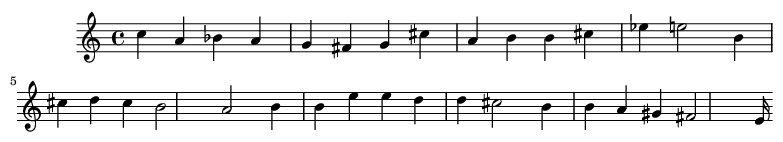

----------------------------------------------------------------------------------------------------


In [30]:
# CODE
test_index = 4
sample = x_test[test_index]
validation = y_test[test_index]
prediction = get_prediction(model,sample,vocabulary,new_df.columns,sample_validation=validation)

### 2.6.- Sección para el código asociado a guardar y cargar el/los modelo/s.

In [39]:
# CODE

def download_best_model():
  !zip -r ./best_model.zip ./checkpoint
  files.download('best_model.zip')

def load_best_model(load_last_trained=False):
  if(not load_last_trained):
    p = Path('./Best_Model/')
    if(p.exists()):
      print("Best model folder exists")
    else:
      print("Best model folder does not exist")
      p.mkdir()
      download_data('best_model.zip')
      !unzip best_model.zip -d ./Best_Model/
    
    model = tf.keras.models.load_model('Best_Model/checkpoint')
  else:
    model = tf.keras.models.load_model('checkpoint')
  return model

#Uncomment to save the last trained model
#download_best_model()

#Uncomment to load/download the best model trained by the author  
#model = load_best_model()

#Uncomment to load last model saved
#model = load_best_model(load_last_trained=True)

Best model folder does not exist


Downloading...
From: https://drive.google.com/uc?id=1Fx-2F-fUcoPynAow6LR1XmIeLNmuX6o8
To: /content/best_model.zip
100%|██████████| 2.56M/2.56M [00:00<00:00, 135MB/s]


Data Downloaded!
Archive:  best_model.zip
   creating: ./Best_Model/checkpoint/
  inflating: ./Best_Model/checkpoint/keras_metadata.pb  
  inflating: ./Best_Model/checkpoint/saved_model.pb  
   creating: ./Best_Model/checkpoint/variables/
  inflating: ./Best_Model/checkpoint/variables/variables.data-00000-of-00001  
  inflating: ./Best_Model/checkpoint/variables/variables.index  
   creating: ./Best_Model/checkpoint/assets/


In [44]:
score = model.evaluate(test_dataset, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.8092504739761353
Test accuracy: 0.779274582862854


### 2.7.- Sección para la implementación de una función sencilla que permita utilizar vuestro/s modelo/s con 1 dato/ejemplo.

Test stream encoding and decoding....
----------------------------------------------------------------------------------------------------
Original stream:


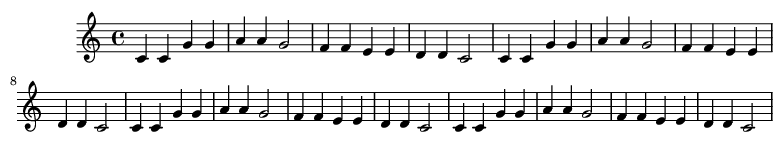

----------------------------------------------------------------------------------------------------
Encoded and decoded stream:
decoded melody: [60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0]
notes and durations [(60, 4), 

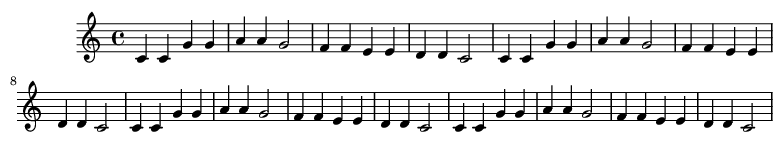

----------------------------------------------------------------------------------------------------


In [40]:
def get_twinkle_twinkle():
  stream1 = stream.Stream()
  for i in range(4):
    C = note.Note("C4")
    G = note.Note("G4")
    A = note.Note("A4")
    F = note.Note("F4")
    E = note.Note("E4")
    D = note.Note("D4")
    stream1.repeatAppend(C, 2)
    stream1.repeatAppend(G, 2)
    stream1.repeatAppend(A, 2)
    G.duration.type = 'half'
    stream1.append(G)
    stream1.repeatAppend(F, 2)
    stream1.repeatAppend(E, 2)
    stream1.repeatAppend(D, 2)
    C.duration.type = 'half'
    stream1.append(C)
  return stream1

def stream_to_notes_and_durations(notes_stream):
  notes_and_durations = []
  for current_note in notes_stream.notes:
    note_name = current_note.nameWithOctave
    note_midi = current_note.pitch.midi
    note_duration = int(current_note.duration.quarterLengthNoTuplets*4)
    notes_and_durations.append((note_midi,note_duration))
    #print(f"name: {note_name} midi: {note_midi} duration: {note_duration}")
  return notes_and_durations

def encode_fragment(notes_and_durations,column_names):
  
  #encode pairs and one hot encode pitch
  pairs_df = pd.DataFrame(np.vstack(notes_and_durations), columns=['pitch','dur'])
  encoded_pairs = encode_duration_in_pitch(pairs_df)
  encoded_frag = one_hot_pitch_data(encoded_pairs)

  #Generate empty columns not present in input
  empty_columns = [col_name for col_name in column_names if not col_name in encoded_frag.columns]   
  width = len(empty_columns)
  height = encoded_pairs.shape[0]
  empty_df  = pd.DataFrame(data=np.zeros((height,width)),columns=empty_columns)
  encoded_frag = pd.concat([encoded_frag,empty_df],axis=1)

  #Reorder columns
  encoded_frag = encoded_frag[column_names]

  return encoded_frag

def stream_to_encoded_frag(fragment_stream,column_names):
  fragment_notes_dur = stream_to_notes_and_durations(fragment_stream)
  encoded_frag= encode_fragment(fragment_notes_dur,column_names)
  return encoded_frag.to_numpy()

print("Test stream encoding and decoding....")
print('-'*100)
print("Original stream:")
twinkle_twinkle_stream = get_twinkle_twinkle()
show(twinkle_twinkle_stream)
play(twinkle_twinkle_stream)
encoded_twinkle_twinkle = stream_to_encoded_frag(twinkle_twinkle_stream,new_df.columns)
print('-'*100)
print("Encoded and decoded stream:")
stream_twinkle_twinkle = encoded_frag_to_stream(encoded_twinkle_twinkle,vocabulary,new_df.columns)
show(stream_twinkle_twinkle)
play(stream_twinkle_twinkle)
print('-'*100)

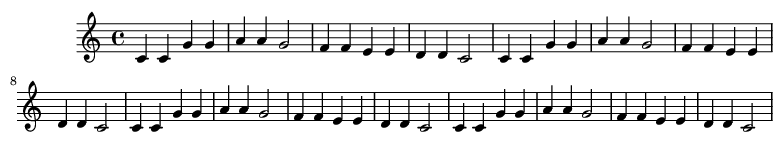

decoded melody: [60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 60, 0, 0, 0, 60, 0, 0, 0, 67, 0, 0, 0, 67, 0, 0, 0, 69, 0, 0, 0, 69, 0, 0, 0, 67, 0, 0, 0, 0, 0, 0, 0, 65, 0, 0, 0, 65, 0, 0, 0, 64, 0, 0, 0, 64, 0, 0, 0, 62, 0, 0, 0, 62, 0, 0, 0, 60, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
notes and durations [(60, 4), (60, 4), (67, 4), (67, 4), (69, 4), (69, 4), (67, 8), (65, 4), (65, 4

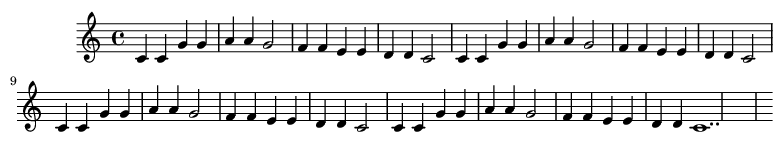

In [42]:
def music_generator(encoded_seed_melody,steps=20):
  model.reset_states()
  melody_generated = encoded_seed_melody
  for step in range(steps):
    pred  = get_prediction(model,melody_generated[-150:],vocabulary,new_df.columns,print_info=False)
    melody_generated =  np.vstack((melody_generated,pred))
  return melody_generated
show(stream_twinkle_twinkle)
play(stream_twinkle_twinkle)
encoded_melody_generated = music_generator(encoded_twinkle_twinkle)
stream_melody_generated= encoded_frag_to_stream(encoded_melody_generated,vocabulary,new_df.columns)
show(stream_melody_generated)
play(stream_melody_generated)

46


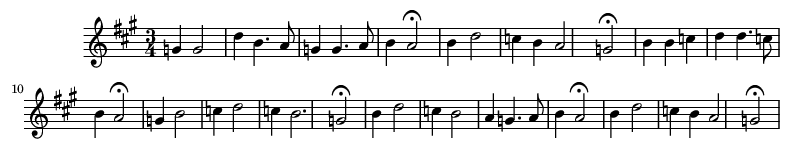

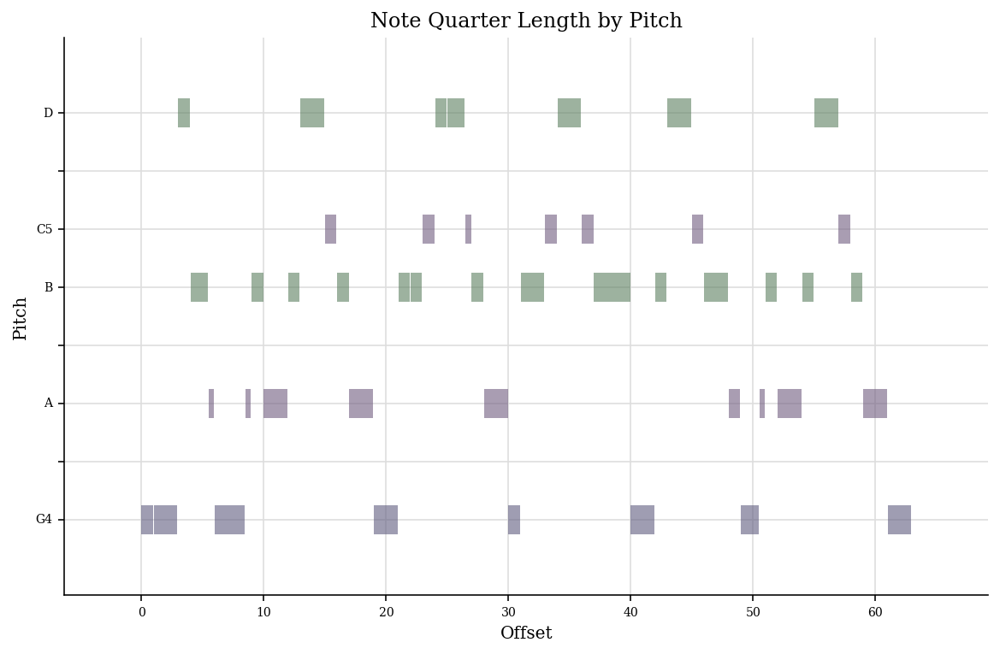

In [43]:
#Shows a fragment with the original data format
def show_fragment(music_fragment_df):
  n_rows = music_fragment_df.shape[0]
  mf_df = music_fragment_df.drop(["id","st"],axis=1)
  num_notes = np.arange(n_rows)
  fragment_stream = stream.Stream()
  for index in num_notes:
    note_attr = mf_df.iloc[index]
    fragment_stream.keySignature = key.KeySignature(3)
    
    time_signature = '3/4' if note_attr["timesig"]==12 else '4/4'
    fragment_stream.timeSignature = meter.TimeSignature(time_signature)
    
    note1 = note.Note(note_attr["pitch"]) 
    note1.duration = duration.Duration(note_attr["dur"]/4)  
    if(note_attr["fermata"]==1):
      note1.expressions.append(expressions.Fermata())
    fragment_stream.append(note1)

  play(fragment_stream)
  show(fragment_stream,show_piano_roll=True)

index = -46
frag_window = 46
ini = index+frag_window
end = ini+frag_window
music_fragment_df = chorales_df.copy(deep=True)
print(music_fragment_df[ini:end].shape[0])
show_fragment(music_fragment_df[ini:end])

## 3.- Análisis de resultados

### 3.1.- Presenta las gráficas de entrenamiento del/los modelo/s anteriormente entrenado/s.

Text(0, 0.5, 'Cross-Entropy')

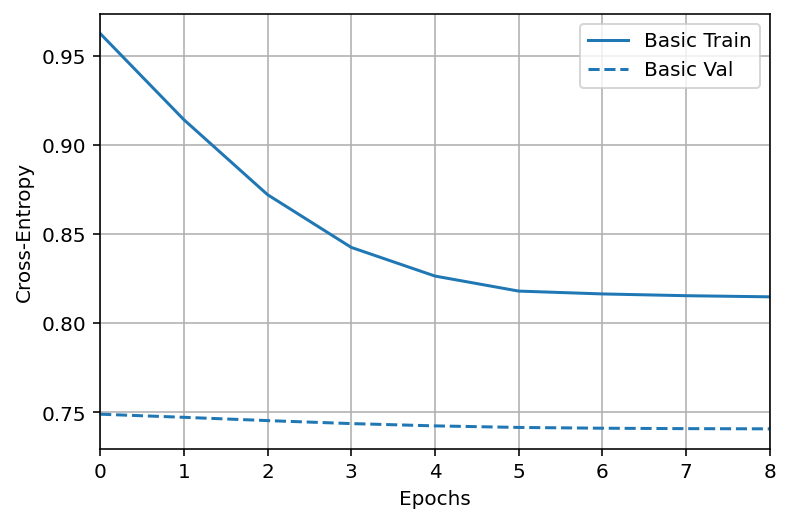

In [36]:
# CODE
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "loss")
plt.ylabel('Cross-Entropy')

Text(0, 0.5, 'Accuracy')

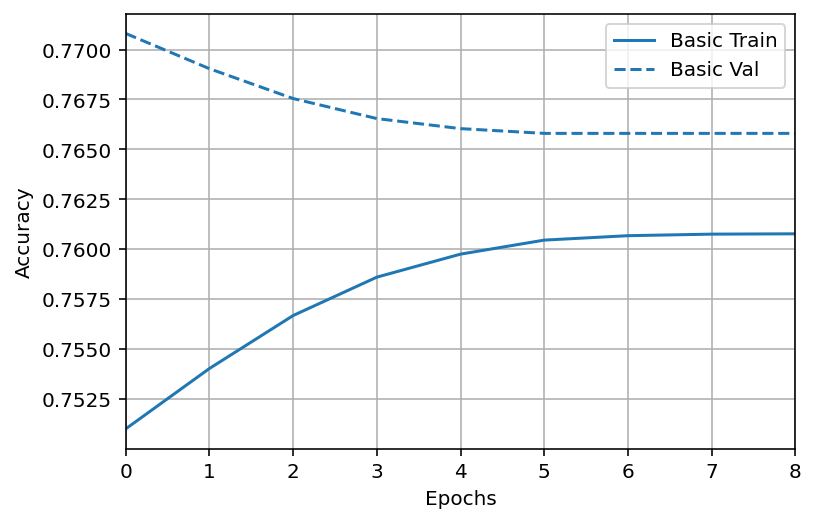

In [37]:
plotter.plot({'Basic': history}, metric = "accuracy")
plt.ylabel('Accuracy')

### 3.2.- Explica cómo ha ido el proceso de entrenamiento (hay algo extraño? se ha entrenado correctamente? se ha estancado?...)

- En la gráfica de "Accuracy" se puede observar que en un principio el modelo empezaba a generalizar mas ya que tanto la curva de validacion empezaban a converger pero luego se volvieron completamente paralelas al igual que los errores lo cual indica que el modelo se estancó y ya no puede aprender mas.

## 4.- Conclusiones

### 4.1.- Se ha resuelto el proyecto como se esperaba? (explicación)

- No, ya que como se puede apreciar en la generación de la melodia el modelo tiende a repetir las notas y para el resto parece escogerlas al azar debido a que no sigue una estructura "creible" a la hora de generar la siguiente nota. Esto se debe  probablemente a la codificacion, que provoca un gran desquilibrio entre las notas "reales" y su repetición ya que de media por cada nota "real" su repeticion es de 3 tiempos por lo que eso explicaria el 75% de aciertos obtenidos por el modelo.

### 4.2.- Que dificultades se han encontrado a la hora de enfrentarse a este proyecto?

- Principalmente en hallar una codificación para el problema y averiguar el como representar las entradas/salidas del modelo para su facil entendimiento. Luego en la etapa de experimentación elegir el tamaño adecuado de la entrada, asi como tambien el mismo diseño del modelo.

### 4.3.- Si tuvieras más tiempo/recursos y empezaras de nuevo a resolver este problema, lo harías de la misma forma? cambiarías algo?

- Probablemente no, primero habria que familiarizarse más con las distintas formas de codificacion del problema (Notación ABC,etc.), para ver si existia alguna forma de codificar la informacion mas eficiente o que provea mayor interpretabilidad. Ademas de tener mas recursos y tiempo se podria pasar mas tiempo en la etapa de experimentación ya que en mi caso no pasaron del par de horas, mientras que la codificacion y tratamiento general del dataset duró dias.

### 4.4.- Propuesta de mejoras (Como evolucionarías este proyecto, que podría cambiarse, ...)

- Mejorar la codificación del modelo.
- Mejorar la estructura del modelo.
- Transponer la linea vocal para generar mas datos
- Añadir mas voces para que el modelo pueda intuir la armonia "vertical" de las corales.
- Conseguir un dataset mas grande y con mas caracteristicas.
